In [ ]:
!pip install darts

In [ ]:
!pip install pypots

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Imputation using PYPOTS library - SAITS (Self-Attention-based Imputation for Time Series) 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import numpy as np 
import pandas as pd

Reading the required data

In [4]:
us_2020_data = pd.read_csv("drive/MyDrive/COVID - Trends Data/2020_country_weekly_2020_US_weekly_symptoms_dataset.csv")
us_2021_data = pd.read_csv("drive/MyDrive/COVID - Trends Data/2021_country_weekly_2021_US_weekly_symptoms_dataset.csv")
us_2022_data = pd.read_csv("drive/MyDrive/COVID - Trends Data/2022_country_weekly_2022_US_weekly_symptoms_dataset.csv")

us_covid_symptom_data = pd.concat([us_2020_data, us_2021_data, us_2022_data], ignore_index=True)
us_covid_symptom_data.head()

,country_region_code,country_region,sub_region_1,sub_region_1_code,sub_region_2,sub_region_2_code,place_id,date,symptom:Abdominal obesity,symptom:Abdominal pain,...,symptom:Wart,symptom:Water retention,symptom:Weakness,symptom:Weight gain,symptom:Wheeze,symptom:Xeroderma,symptom:Xerostomia,symptom:Yawn,symptom:hyperhidrosis,symptom:pancreatitis
0,US,United States,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-01-06,3.00,5.67,...,1.69,0.33,0.49,4.29,0.39,3.30,0.52,0.22,0.66,0.47
1,US,United States,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-01-13,2.93,5.59,...,1.67,0.34,0.52,4.20,0.37,3.12,0.51,0.22,0.66,0.47
2,US,United States,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-01-20,2.92,5.69,...,1.66,0.34,0.51,4.27,0.38,3.53,0.54,0.22,0.67,0.47
3,US,United States,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-01-27,2.77,5.61,...,1.65,0.34,0.52,4.14,0.39,3.12,0.53,0.21,0.67,0.45
4,US,United States,NaN,NaN,NaN,NaN,ChIJCzYy5IS16lQRQrfeQ5K5Oxw,2020-02-03,2.91,5.64,...,1.60,0.35,0.53,4.19,0.40,3.25,0.53,0.22,0.68,0.45


In [5]:
all_regions = set(us_covid_symptom_data['sub_region_1'].values[~pd.isnull(us_covid_symptom_data['sub_region_1'])])
clean_ul = 0
mod_ul = clean_ul
clean_regions = []
mod_regions = []
bad_regions = []
for region in all_regions:
    region_data = us_covid_symptom_data[us_covid_symptom_data['sub_region_1']==region].values[:,8:]
    num_missing = pd.isnull(region_data).any(axis=1).sum()
    total = region_data.shape[0]*region_data.shape[1]
    # print(f"Region: {region} | Number of missing values: {num_missing} | % of missing values: {num_missing*100/total}")
    if num_missing <= clean_ul:
        clean_regions.append(region)
    elif (num_missing <= mod_ul):
        mod_regions.append(region)
    else:
        bad_regions.append(region)

print(f"Clean Regions: Size = {len(clean_regions)}")
print(clean_regions)

print(f"Moderate clean Regions: Size = {len(mod_regions)}")
print(mod_regions)

print(f"Bad Regions: Size = {len(bad_regions)}")
print(bad_regions)

Clean Regions: Size = 20
['Massachusetts', 'Georgia', 'Florida', 'Virginia', 'North Carolina', 'Missouri', 'Washington', 'Texas', 'New York', 'Tennessee', 'Michigan', 'Indiana', 'Arizona', 'Colorado', 'Pennsylvania', 'California', 'Illinois', 'Minnesota', 'Ohio', 'New Jersey']
Moderate clean Regions: Size = 0
[]
Bad Regions: Size = 31
['Alabama', 'Iowa', 'Wisconsin', 'Rhode Island', 'Louisiana', 'South Carolina', 'Nevada', 'New Hampshire', 'Arkansas', 'Oklahoma', 'Mississippi', 'Delaware', 'Connecticut', 'Maryland', 'Alaska', 'Nebraska', 'Utah', 'New Mexico', 'West Virginia', 'Hawaii', 'Wyoming', 'Montana', 'Oregon', 'Maine', 'South Dakota', 'Kentucky', 'Vermont', 'Kansas', 'North Dakota', 'District of Columbia', 'Idaho']


In [6]:
#Considering the required clean and bad regions

clean_regions_final = ["Georgia", "Florida", "Tennessee", "North Carolina", "Virginia", "California", "Arizona", "Washington"]

bad_regions_final = ["Alabama","South Carolina", "Mississippi", "Virginia", "Nevada", "Oregon", "Utah", "Idaho", "New Mexico"]

georgia_one_neighbors_bad_data = ["Alabama", "South Carolina"]

georgia_two_neighbors_bad_data = ["Mississippi", "Arkansas", "Kentucky"]

cali_one_neighbors_bad_data = ["Nevada", "Oregon"]

cali_two_neighbors_bad_data = ["Utah", "Idaho", "New Mexico"]

IMPUTING GOOD QUALITY DATA REGION - VALIDATION

In [ ]:
from pypots.imputation import SAITS
from pypots.data import mcar, masked_fill

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

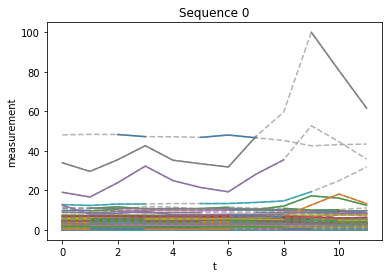

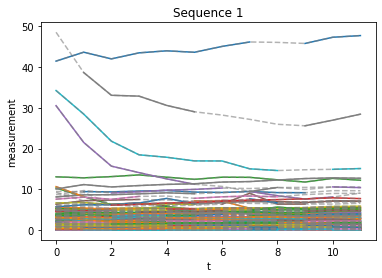

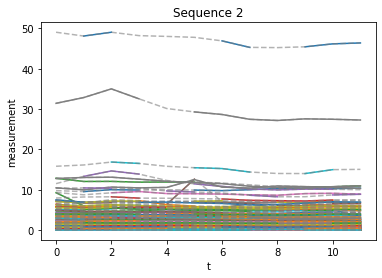

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.8488, validating loss 1.2162
epoch 1: training loss 2.3454, validating loss 1.1740
epoch 2: training loss 2.3064, validating loss 1.0961
epoch 3: training loss 2.1507, validating loss 1.0168
epoch 4: training loss 2.0178, validating loss 0.9646
epoch 5: training loss 1.8579, validating loss 0.8893
epoch 6: training loss 1.6777, validating loss 0.7993
epoch 7: training loss 1.5657, validating loss 0.7230
epoch 8: training loss 1.4446, validating loss 0.6266
epoch 9: training loss 1.3720, validating loss 0.5908
epoch 10: training loss 1.3069, validating loss 0.5617
epoch 11: training loss 1.2748, validating loss 0.4857
epoch 12: training loss 1.2226, validating loss 0.4440
epoch 13: training loss 1.1664, validating loss 0.4414
epoch 14: training loss 1.1051, validating loss 0.4329
epoch 15: training loss 1.0592, validating loss 0.4259
epoch 16: t

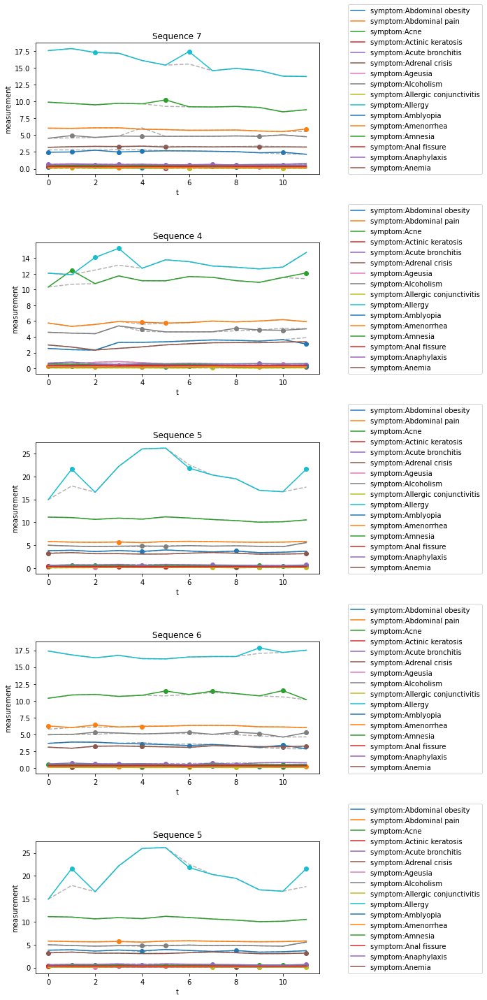

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Georgia_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

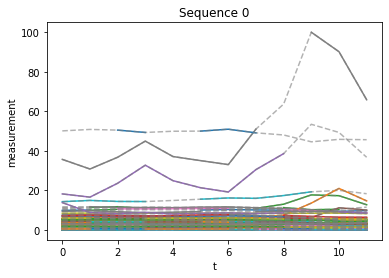

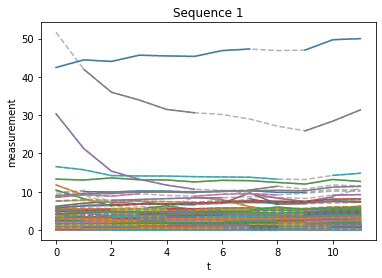

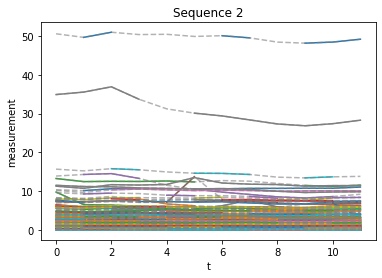

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.8682, validating loss 1.3115
epoch 1: training loss 2.4724, validating loss 1.2778
epoch 2: training loss 2.4123, validating loss 1.2126
epoch 3: training loss 2.3085, validating loss 1.1350
epoch 4: training loss 2.0665, validating loss 1.0443
epoch 5: training loss 1.9573, validating loss 0.9517
epoch 6: training loss 1.7862, validating loss 0.8847
epoch 7: training loss 1.6982, validating loss 0.7728
epoch 8: training loss 1.5381, validating loss 0.7008
epoch 9: training loss 1.4720, validating loss 0.6549
epoch 10: training loss 1.4015, validating loss 0.5888
epoch 11: training loss 1.3663, validating loss 0.5416
epoch 12: training loss 1.2867, validating loss 0.5165
epoch 13: training loss 1.2187, validating loss 0.5042
epoch 14: training loss 1.2128, validating loss 0.5017
epoch 15: training loss 1.1884, validating loss 0.4609
epoch 16: t

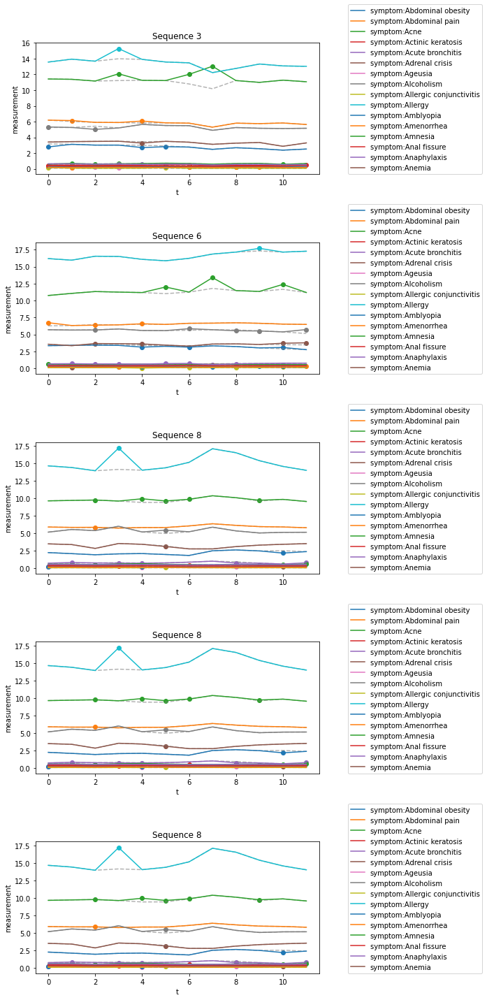

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Florida_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

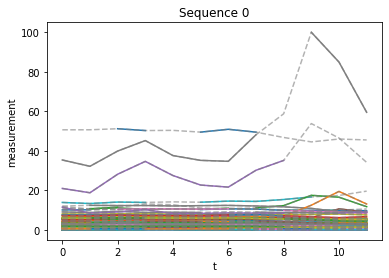

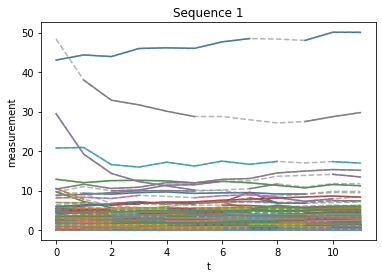

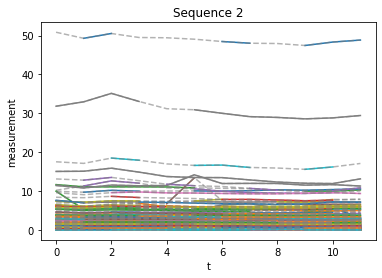

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 3.1434, validating loss 1.3845
epoch 1: training loss 2.6661, validating loss 1.2970
epoch 2: training loss 2.5681, validating loss 1.2352
epoch 3: training loss 2.4634, validating loss 1.1433
epoch 4: training loss 2.2797, validating loss 1.0899
epoch 5: training loss 2.1004, validating loss 1.0044
epoch 6: training loss 1.9861, validating loss 0.9346
epoch 7: training loss 1.7794, validating loss 0.8239
epoch 8: training loss 1.6368, validating loss 0.7275
epoch 9: training loss 1.5508, validating loss 0.6895
epoch 10: training loss 1.5097, validating loss 0.6147
epoch 11: training loss 1.4102, validating loss 0.5560
epoch 12: training loss 1.3935, validating loss 0.5377
epoch 13: training loss 1.3338, validating loss 0.4971
epoch 14: training loss 1.2316, validating loss 0.4543
epoch 15: training loss 1.2060, validating loss 0.4590
epoch 16: t

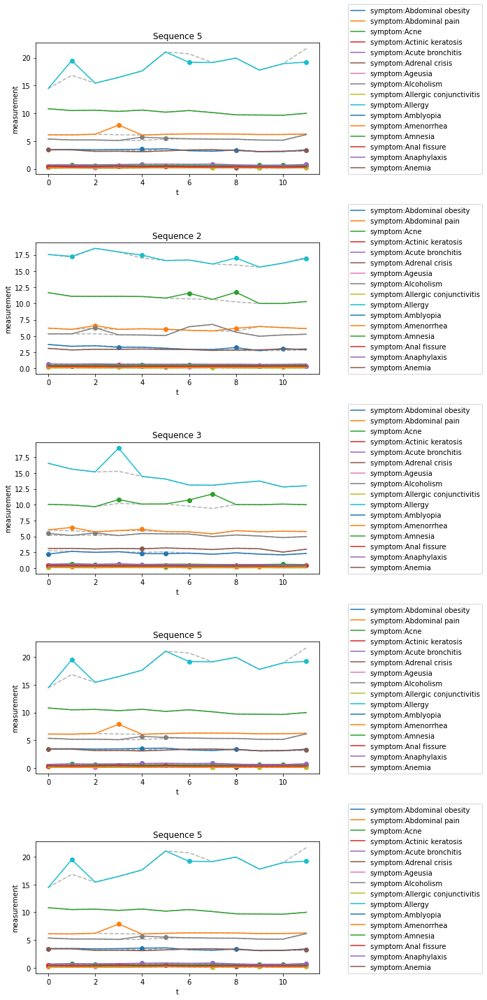

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Tennessee_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

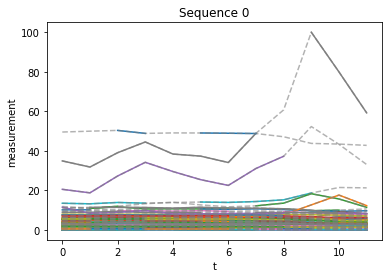

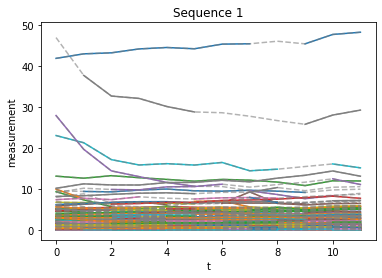

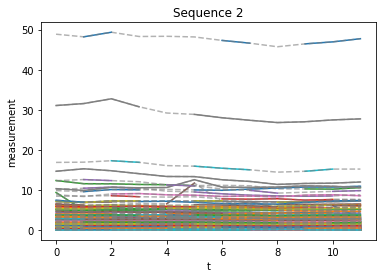

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.8716, validating loss 1.3158
epoch 1: training loss 2.4657, validating loss 1.2608
epoch 2: training loss 2.3665, validating loss 1.2001
epoch 3: training loss 2.2248, validating loss 1.1106
epoch 4: training loss 2.0714, validating loss 1.0213
epoch 5: training loss 1.9144, validating loss 0.9461
epoch 6: training loss 1.7623, validating loss 0.8540
epoch 7: training loss 1.5418, validating loss 0.7629
epoch 8: training loss 1.4728, validating loss 0.6804
epoch 9: training loss 1.3701, validating loss 0.6457
epoch 10: training loss 1.3054, validating loss 0.5758
epoch 11: training loss 1.2368, validating loss 0.5143
epoch 12: training loss 1.2092, validating loss 0.4736
epoch 13: training loss 1.1939, validating loss 0.4897
epoch 14: training loss 1.1185, validating loss 0.4563
epoch 15: training loss 1.0948, validating loss 0.4299
epoch 16: t

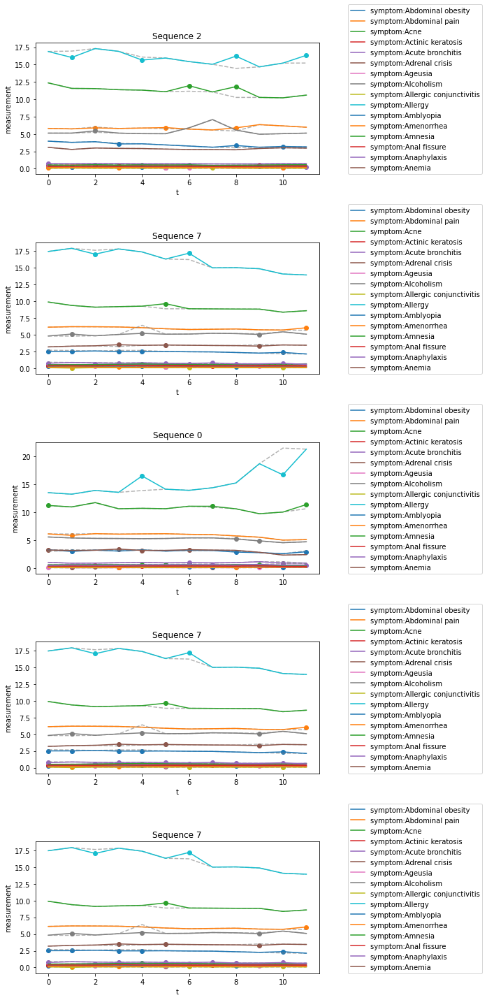

Saved successfully to /content/drive/My Drive/COVID - Trends Data/North Carolina_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

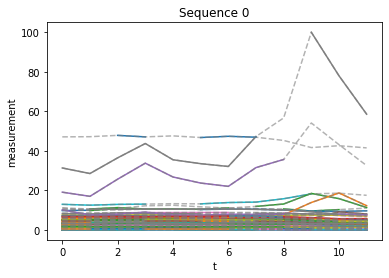

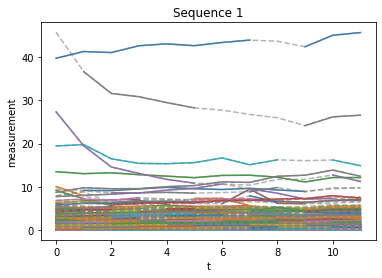

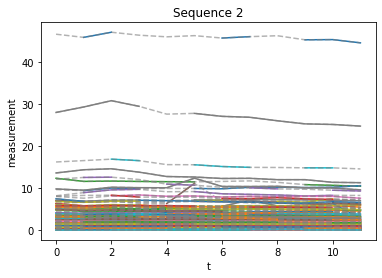

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.9137, validating loss 1.3105
epoch 1: training loss 2.4620, validating loss 1.2453
epoch 2: training loss 2.3914, validating loss 1.1843
epoch 3: training loss 2.2605, validating loss 1.0787
epoch 4: training loss 2.1083, validating loss 0.9921
epoch 5: training loss 1.9237, validating loss 0.9232
epoch 6: training loss 1.7909, validating loss 0.8471
epoch 7: training loss 1.5811, validating loss 0.7450
epoch 8: training loss 1.4859, validating loss 0.6919
epoch 9: training loss 1.3770, validating loss 0.6238
epoch 10: training loss 1.2942, validating loss 0.5447
epoch 11: training loss 1.2273, validating loss 0.4934
epoch 12: training loss 1.1776, validating loss 0.4653
epoch 13: training loss 1.1274, validating loss 0.4719
epoch 14: training loss 1.0925, validating loss 0.4160
epoch 15: training loss 0.9972, validating loss 0.3911
epoch 16: t

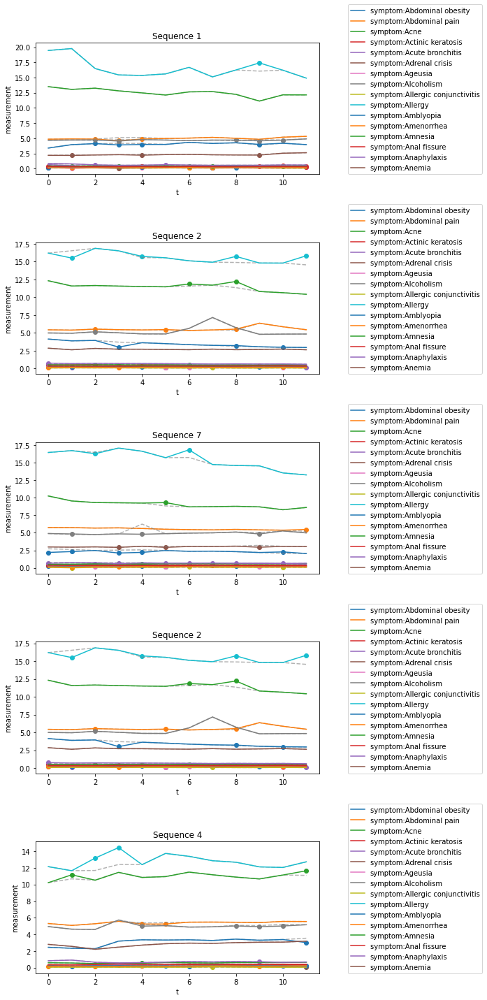

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Virginia_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

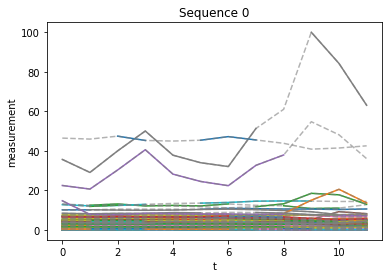

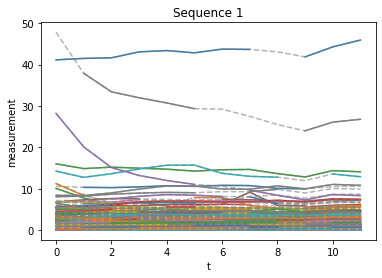

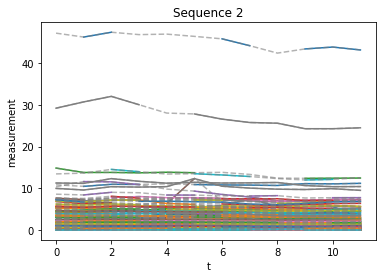

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.8585, validating loss 1.2979
epoch 1: training loss 2.4473, validating loss 1.2306
epoch 2: training loss 2.3637, validating loss 1.1475
epoch 3: training loss 2.2518, validating loss 1.0695
epoch 4: training loss 2.0947, validating loss 0.9924
epoch 5: training loss 1.9087, validating loss 0.8997
epoch 6: training loss 1.7202, validating loss 0.7984
epoch 7: training loss 1.5734, validating loss 0.6868
epoch 8: training loss 1.3980, validating loss 0.6279
epoch 9: training loss 1.3090, validating loss 0.6121
epoch 10: training loss 1.2988, validating loss 0.5328
epoch 11: training loss 1.1893, validating loss 0.4514
epoch 12: training loss 1.1023, validating loss 0.4500
epoch 13: training loss 1.0513, validating loss 0.4166
epoch 14: training loss 0.9870, validating loss 0.4294
epoch 15: training loss 1.0182, validating loss 0.4122
epoch 16: t

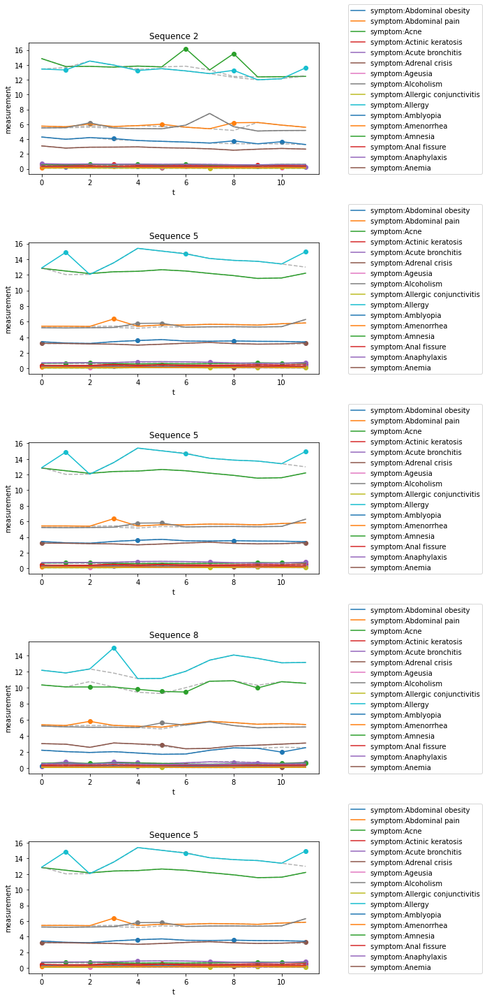

Saved successfully to /content/drive/My Drive/COVID - Trends Data/California_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

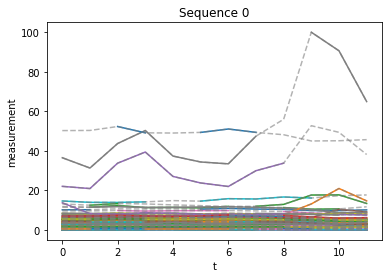

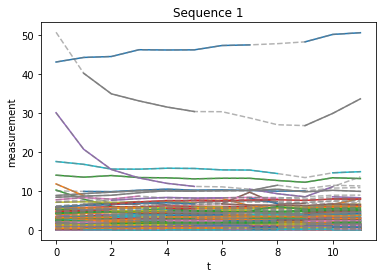

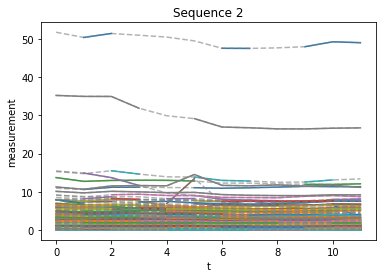

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 3.1294, validating loss 1.3764
epoch 1: training loss 2.5597, validating loss 1.2647
epoch 2: training loss 2.4397, validating loss 1.1997
epoch 3: training loss 2.3343, validating loss 1.0880
epoch 4: training loss 2.0898, validating loss 1.0056
epoch 5: training loss 1.9449, validating loss 0.9006
epoch 6: training loss 1.7576, validating loss 0.8139
epoch 7: training loss 1.5185, validating loss 0.7528
epoch 8: training loss 1.4251, validating loss 0.6908
epoch 9: training loss 1.3828, validating loss 0.6191
epoch 10: training loss 1.3306, validating loss 0.5351
epoch 11: training loss 1.2271, validating loss 0.5177
epoch 12: training loss 1.1837, validating loss 0.4565
epoch 13: training loss 1.1624, validating loss 0.4626
epoch 14: training loss 1.0606, validating loss 0.4438
epoch 15: training loss 1.0197, validating loss 0.4541
epoch 16: t

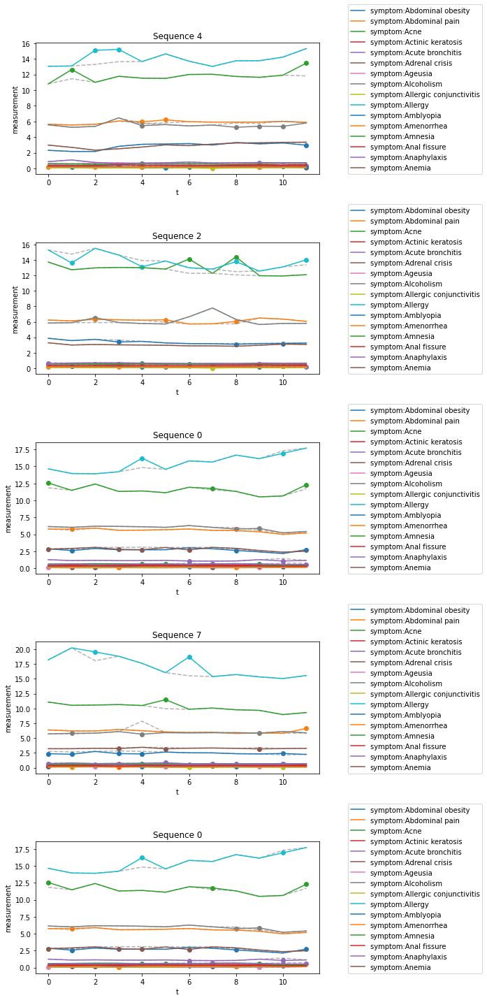

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Arizona_state_model_100_epochs_20_masked_saits.pt.
(9, 422, 12)
2
(2, 422, 12)


<Figure size 864x576 with 0 Axes>

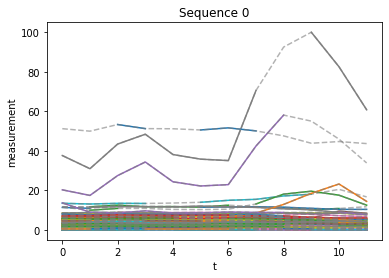

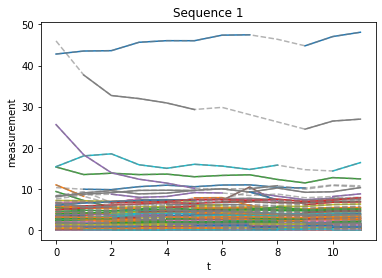

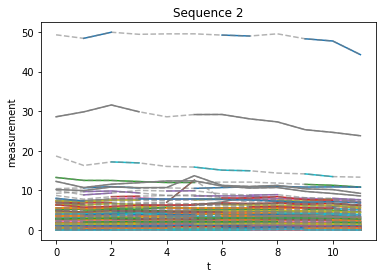

No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
epoch 0: training loss 2.9942, validating loss 1.3279
epoch 1: training loss 2.5260, validating loss 1.2830
epoch 2: training loss 2.4585, validating loss 1.1983
epoch 3: training loss 2.2983, validating loss 1.1207
epoch 4: training loss 2.1225, validating loss 1.0800
epoch 5: training loss 1.9946, validating loss 0.9997
epoch 6: training loss 1.8474, validating loss 0.9003
epoch 7: training loss 1.7200, validating loss 0.7968
epoch 8: training loss 1.5718, validating loss 0.7322
epoch 9: training loss 1.4916, validating loss 0.6871
epoch 10: training loss 1.4646, validating loss 0.6036
epoch 11: training loss 1.3631, validating loss 0.5538
epoch 12: training loss 1.2801, validating loss 0.5467
epoch 13: training loss 1.2546, validating loss 0.5088
epoch 14: training loss 1.1790, validating loss 0.5013
epoch 15: training loss 1.1469, validating loss 0.4320
epoch 16: t

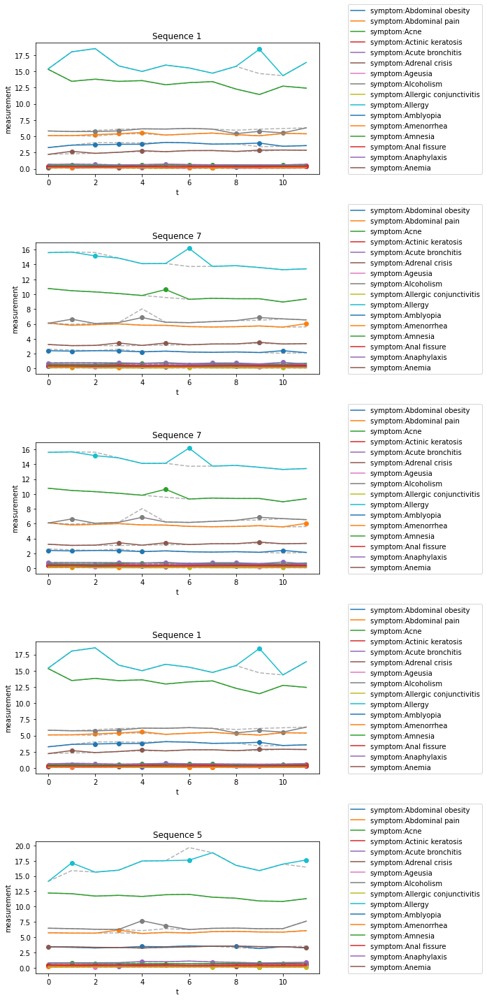

Saved successfully to /content/drive/My Drive/COVID - Trends Data/Washington_state_model_100_epochs_20_masked_saits.pt.


In [ ]:
#training models for good quality regions
import torch
import matplotlib.pyplot as plt
import math

for clean_region in clean_regions_final:
  region_symptom_data = us_covid_symptom_data[us_covid_symptom_data['sub_region_1'] == clean_region ]
  region_symptom_data = region_symptom_data.drop(['country_region', 'country_region_code', 'sub_region_1', 'sub_region_1_code', 'sub_region_2', 'sub_region_2_code', 'place_id'], axis = 1)
  region_symptom_data.index = pd.to_datetime(region_symptom_data.date)
  region_symptom_data = region_symptom_data.drop('date', axis = 1)
  train_symptoms, val_symptoms = region_symptom_data[:-32], region_symptom_data[-32:]

  '''_, train_symptoms_np, missing_mask, _ = mcar(train_symptoms.to_numpy(), 0.3)
  train_symptoms_np = masked_fill(train_symptoms_np, 1 - missing_mask, torch.nan)
  _, val_symptoms_np, missing_mask, _ = mcar(val_symptoms.to_numpy(), 0.3)
  val_symptoms_np = masked_fill(val_symptoms_np, 1 - missing_mask, torch.nan)'''
  
  train_symptoms_T = train_symptoms.T
  nchunks = 9
  chunksize = int(train_symptoms_T.shape[1] / nchunks)
  chunked=[train_symptoms_T.iloc[:,chunksize*i:chunksize*(i+1)] for i in range(nchunks)]
  print (np.shape(np.array(chunked)))
  data = torch.tensor(np.array(chunked)).float()#.cuda() when on GPU

  val_symptoms_T = val_symptoms.T
  n_chunks_val = int(val_symptoms_T.shape[1]/chunksize)
  print (n_chunks_val)
  chunked=[val_symptoms_T.iloc[:,chunksize*i:chunksize*(i+1)] for i in range(n_chunks_val)]
  print (np.shape(np.array(chunked)))
  val_data = torch.tensor(np.array(chunked)).float()#.cuda() when on GPU

  mask = torch.ones_like(data).float()
  delta = torch.ones_like(data).float()
  delta[:,:,0] = 0

  ground_truth = data.detach().clone()
  # remove 20% of the data
  np.random.seed(20)
  ix = [(row,channel, step) for row in range(data.shape[0]) for channel in range(data.shape[1]) for step in range(data.shape[2])]
  np.random.shuffle(ix)
  to_replace = int(round(.2*len(ix)))
  ix = ix[:to_replace]

  for idx in ix:
      data[idx[0],idx[1],idx[2]] = np.nan
      mask[idx[0],idx[1],idx[2]] = 0

  plt.figure(figsize=(12,8))
  for pl in range(3):
      plt.subplots(1,1)
      plt.title("Sequence {}".format(pl))
      plt.xlabel("t")
      plt.ylabel("measurement")
      for dim in range(422):
          plt.plot(np.arange(12),data[pl,dim,:].cpu())
          plt.plot(np.arange(12),ground_truth[pl,dim,:].cpu(),c="grey",linestyle="dashed",alpha=0.6)
  plt.show()

  saits = SAITS(
            422,
            12,
            n_layers=2,
            d_model=256,
            d_inner=128,
            n_head=4,
            d_k=64,
            d_v=64,
            dropout=0.1,
            epochs=100,
  )
  result = saits.fit(data, val_data)

  new_data = saits.impute(data)

  plt.figure(figsize=(10,20))
  for row in range(5):
      randidx = np.random.randint(0,new_data.shape[0])
      
      plt.subplot(5,1,(row+1))
      plt.title("Sequence {}".format(randidx))
      plt.xlabel("t")
      plt.ylabel("measurement")
      missing = (mask[randidx]==0).cpu()
      for dim in range(16):
          plt.plot(np.arange(12),ground_truth[randidx,dim,:],linestyle="dashed",c="grey",alpha=0.6 )
          plt.plot(np.arange(12),new_data[randidx,dim,:], label = region_symptom_data.columns[dim])
          plt.scatter(np.arange(12)[missing[dim]],new_data[randidx,dim,:][missing[dim]])
      plt.legend(loc=(1.1,0))
  plt.tight_layout()
  plt.show()

  PATH = F"/content/drive/My Drive/COVID - Trends Data/" + str(clean_region) + "_state_model_100_epochs_20_masked_saits.pt"
  model = saits.save_model(PATH)


In [ ]:
#imputing georgia's bad neighbors

georgia_saits_model = SAITS(
            422,
            12,
            n_layers=2,
            d_model=256,
            d_inner=128,
            n_head=4,
            d_k=64,
            d_v=64,
            dropout=0.1,
            epochs=100,
  )

georgia_saits_model.load_model("/content/drive/My Drive/COVID - Trends Data/" + "Georgia" + "_state_model_100_epochs_20_masked_saits.pt")

georgia_neighbors_bad_data = georgia_one_neighbors_bad_data + georgia_two_neighbors_bad_data

for georgia_neighbor in georgia_neighbors_bad_data:
  region_symptom_data = us_covid_symptom_data[us_covid_symptom_data['sub_region_1'] == georgia_neighbor ]
  region_symptom_data = region_symptom_data.drop(['country_region', 'country_region_code', 'sub_region_1', 'sub_region_1_code', 'sub_region_2', 'sub_region_2_code', 'place_id'], axis = 1)
  region_symptom_data.index = pd.to_datetime(region_symptom_data.date)
  region_symptom_data = region_symptom_data.drop('date', axis = 1)

  symptoms_T = region_symptom_data.T
  nchunks = 12
  chunksize = int(symptoms_T.shape[1] / nchunks)
  chunked=[symptoms_T.iloc[:,chunksize*i:chunksize*(i+1)] for i in range(nchunks)]
  data = torch.tensor(np.array(chunked)).float()

  resulting_data = georgia_saits_model.impute(data)
  resulting_data_reshaped = resulting_data.reshape(422,144)
  resulting_data_reshaped = resulting_data_reshaped.T
  res_df = pd.DataFrame (resulting_data_reshaped, columns = region_symptom_data.columns)
  res_df['date'] = region_symptom_data.index

  res_df.to_csv("/content/drive/My Drive/COVID - Trends Data/" + str(georgia_neighbor) + "_imputed_data.csv", index = False)
  print ("Imputed data of " + str(georgia_neighbor) + " saved successfully!")




No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
Model loaded successfully from /content/drive/My Drive/COVID - Trends Data/Georgia_state_model_100_epochs_20_masked_saits.pt.
Imputed data of Alabama saved successfully!
Imputed data of South Carolina saved successfully!
Imputed data of Mississippi saved successfully!
Imputed data of Arkansas saved successfully!
Imputed data of Kentucky saved successfully!


In [ ]:
#imputing california's bad neighbors

cali_saits_model = SAITS(
            422,
            12,
            n_layers=2,
            d_model=256,
            d_inner=128,
            n_head=4,
            d_k=64,
            d_v=64,
            dropout=0.1,
            epochs=100,
  )

cali_saits_model.load_model("/content/drive/My Drive/COVID - Trends Data/" + "California" + "_state_model_100_epochs_20_masked_saits.pt")

cali_bad_data = cali_one_neighbors_bad_data + cali_two_neighbors_bad_data

for cali_neighbor in cali_bad_data:
  region_symptom_data = us_covid_symptom_data[us_covid_symptom_data['sub_region_1'] == cali_neighbor ]
  region_symptom_data = region_symptom_data.drop(['country_region', 'country_region_code', 'sub_region_1', 'sub_region_1_code', 'sub_region_2', 'sub_region_2_code', 'place_id'], axis = 1)
  region_symptom_data.index = pd.to_datetime(region_symptom_data.date)
  region_symptom_data = region_symptom_data.drop('date', axis = 1)

  symptoms_T = region_symptom_data.T
  nchunks = 12
  chunksize = int(symptoms_T.shape[1] / nchunks)
  chunked=[symptoms_T.iloc[:,chunksize*i:chunksize*(i+1)] for i in range(nchunks)]
  data = torch.tensor(np.array(chunked)).float()

  resulting_data = cali_saits_model.impute(data)
  resulting_data_reshaped = resulting_data.reshape(422,144)
  resulting_data_reshaped = resulting_data_reshaped.T
  res_df = pd.DataFrame (resulting_data_reshaped, columns = region_symptom_data.columns)
  res_df['date'] = region_symptom_data.index

  res_df.to_csv("/content/drive/My Drive/COVID - Trends Data/" + str(cali_neighbor) + "_imputed_data.csv", index = False)
  print ("Imputed data of " + str(cali_neighbor) + " saved successfully!")


No given device, using default device: cpu
Model initialized successfully. Number of the trainable parameters: 1340696
Model loaded successfully from /content/drive/My Drive/COVID - Trends Data/California_state_model_100_epochs_20_masked_saits.pt.
Imputed data of Nevada saved successfully!
Imputed data of Oregon saved successfully!
Imputed data of Utah saved successfully!
Imputed data of Idaho saved successfully!
Imputed data of New Mexico saved successfully!


GRANGER

In [7]:
results = pd.read_csv("drive/MyDrive/COVID - Trends Data/allstates_correlation_features.csv")
df = {'state': [], 'grangersymptoms':[], 'correlationsymptoms':[]}
number_of_symptoms = 20
for region in results['state'].unique():
    df['state'].append(region)
    df['grangersymptoms'].append(results[results['state'] == region].sort_values(by='grangerCausalityPVal', ascending=True).head(number_of_symptoms)['symptom'].values)
    df['correlationsymptoms'].append(results[results['state'] == region].sort_values(by='abscorrelation',  ascending=True).head(number_of_symptoms)['symptom'].values)

df = pd.DataFrame(df)
df.head()

,state,grangersymptoms,correlationsymptoms
0,AL,"[symptom:Eye pain, symptom:Cardiac arrest, sym...","[symptom:Rectal pain, symptom:Uterine contract..."
1,AK,"[symptom:Low-grade fever, symptom:Angina pecto...","[symptom:Photodermatitis, symptom:Shallow brea..."
2,AZ,"[symptom:Eye pain, symptom:Hypoxemia, symptom:...","[symptom:Angular cheilitis, symptom:Amenorrhea..."
3,AR,"[symptom:Throat irritation, symptom:Eye pain, ...","[symptom:Dyspareunia, symptom:Night terror, sy..."
4,CA,"[symptom:Eye pain, symptom:Throat irritation, ...","[symptom:Neck pain, symptom:Myocardial infarct..."


PREDICTION FOR GOOD REGIONS


In [ ]:
import pandas as pd 
import pickle as pkl

cdc_df_path = 'drive/MyDrive/COVID - Trends Data/United_States_COVID-19_Cases_and_Deaths_by_State_over_Time.csv'
cdc_df = pd.read_csv(cdc_df_path)
cdc_states = {}

for region in cdc_df['state'].unique():
    statedf = cdc_df[cdc_df['state'] == region]
    statedf['date'] = pd.to_datetime(statedf['submission_date'])
    statedf = statedf.drop(['submission_date'], axis=1)
    statedf = statedf.resample('W-MON', on='date').sum()
    statedf = statedf.reset_index()
    # Get full 
    statedf['state'] = region
    try:
        pkl.dump(statedf, open(f"drive/MyDrive/COVID - Trends Data/weekly/{region}/CDCdataset.pkl", "wb"))
    except FileNotFoundError:
        pass
    cdc_states[region] = statedf

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


In [ ]:
input_chunk_length_good_regions_nbeats = {"Georgia" : 15, "California": 20, "Florida": 18, "Tennessee": 10, "North Carolina": 25, "Virginia": 25, "Arizona": 25 , "Washington": 25 }

In [ ]:
import plotly.express as px
from darts.utils.utils import TimeSeries
from darts.dataprocessing.transformers import Scaler as sc
from darts.models import NBEATSModel, TCNModel
import matplotlib.pyplot as plt
from darts.metrics import mse

for clean_region in clean_regions_final:
  region_symptom_data = us_covid_symptom_data[us_covid_symptom_data.sub_region_1 == clean_region]
  region_symptom_data['date'] = pd.to_datetime(region_symptom_data.date)
  region_code = region_symptom_data.sub_region_1_code.unique()[0].split('US-')[1]
  region_symptom_data = region_symptom_data.drop(['country_region', 'country_region_code', 'sub_region_1', 'sub_region_1_code', 'sub_region_2', 'sub_region_2_code', 'place_id'], axis = 1)
  merged_region_cdc_symptoms = region_symptom_data.merge(cdc_states[region_code], on='date', how='outer')
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['conf_cases', 'prob_cases', 'pnew_case', 'tot_death', 'conf_death', 'prob_death', 'new_death', 'pnew_death', 'state'], axis = 1)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['tot_cases'], axis = 1)
  merged_region_cdc_symptoms['new_case'] = merged_region_cdc_symptoms['new_case'].fillna(0)
  fig = px.line(merged_region_cdc_symptoms, x='date', y="new_case")
  fig.show()
  merged_region_cdc_symptoms.index = pd.to_datetime(merged_region_cdc_symptoms.date)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['date'], axis = 1)
  symptoms_considered = df[df.state == region_code]
  symptoms_considered.reset_index()
  symptoms_considered = symptoms_considered['grangersymptoms']
  symptoms_considered = symptoms_considered.values
  symptoms_considered = symptoms_considered[0]
  cols_to_keep = np.append(symptoms_considered, np.array(['new_case']))
  symptoms_considered_cdc = merged_region_cdc_symptoms[cols_to_keep]
  time_series_merged_region_cdc = TimeSeries.from_dataframe(symptoms_considered_cdc)
  symptom_scaler = sc()
  scaled_time_series_region_cdc = symptom_scaler.fit_transform(time_series_merged_region_cdc)
  new_cases = time_series_merged_region_cdc['new_case']
  new_cases_train, new_cases_val = new_cases.split_before(0.6)
  past_covariates = scaled_time_series_region_cdc.drop_columns('new_case')
  past_covariates_train , past_covariates_val = past_covariates.split_before(0.6)
  input_c_length_nbeats = input_chunk_length_good_regions_nbeats[clean_region]
  model_prediction = NBEATSModel (input_chunk_length=input_c_length_nbeats, output_chunk_length=5, n_epochs = 200)
  model_prediction.fit(new_cases_train, past_covariates=past_covariates_train, verbose = True)
  pred_new_case = model_prediction.predict(n = 5)
  print("RMSE scaled data:", np.sqrt(mse(new_cases_val['new_case'][:5] , pred_new_case['new_case'])))
  pred_new_case = symptom_scaler.inverse_transform(pred_new_case)
  val_descaled = symptom_scaler.inverse_transform(new_cases_val)
  print("RMSE :", np.sqrt(mse(val_descaled['new_case'][:5] , pred_new_case['new_case'])))
  time_series_merged_region_cdc['new_case'].plot(label = "actual")
  pred_new_case['new_case'].plot(label = 'forecasted')
  plt.show()
  



In [ ]:
input_chunk_length_good_regions_tcn = {"Georgia" : 25, "California": 25, "Florida": 20, "Tennessee": 25, "North Carolina": 25, "Virginia": 20, "Arizona": 15 , "Washington": 30 }

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type              | Params
----------------------------------------------------
0 | criterion     | MSELoss           | 0     
1 | train_metrics | MetricCollection  | 0     
2 | val_metrics   | MetricCollection  | 0     
3 | dropout       | MonteCarloDropout | 0     
4 | res_blocks    | ModuleList        | 17.5 K
----------------------------------------------------
17.5 K    Trainable params
0         Non-trainable params
17.5 K    Total params
0.140     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=500` reached.

  0%|          | 0/40 [00:00<?, ?it/s]

Predicting: 3it [00:00, ?it/s]


  2%|▎         | 1/40 [00:00<00:05,  7.50it/s]

Predicting: 3it [00:00, ?it/s]


  5%|▌         | 2/40 [00:00<00:04,  8.19it/s]

Predicting: 3it [00:00, ?it/s]


  8%|▊         | 3/40 [00:00<00:04,  8.52it/s]

Predicting: 3it [00:00, ?it/s]


 10%|█         | 4/40 [00:00<00:04,  8.09it/s]

Predicting: 3it [00:00, ?it/s]


 12%|█▎        | 5/40 [00:00<00:04,  7.81it/s]

Predicting: 3it [00:00, ?it/s]


 15%|█▌        | 6/40 [00:00<00:04,  8.05it/s]

Predicting: 3it [00:00, ?it/s]


 18%|█▊        | 7/40 [00:00<00:04,  7.67it/s]

Predicting: 3it [00:00, ?it/s]


 20%|██        | 8/40 [00:01<00:04,  7.65it/s]

Predicting: 3it [00:00, ?it/s]


 22%|██▎       | 9/40 [00:01<00:04,  7.65it/s]

Predicting: 3it [00:00, ?it/s]


 25%|██▌       | 10/40 [00:01<00:03,  7.59it/s]

Predicting: 3it [00:00, ?it/s]


 28%|██▊       | 11/40 [00:01<00:03,  7.56it/s]

Predicting: 3it [00:00, ?it/s]


 30%|███       | 12/40 [00:01<00:03,  7.17it/s]

Predicting: 3it [00:00, ?it/s]


 32%|███▎      | 13/40 [00:01<00:03,  7.37it/s]

Predicting: 3it [00:00, ?it/s]


 35%|███▌      | 14/40 [00:01<00:03,  7.21it/s]

Predicting: 3it [00:00, ?it/s]


 38%|███▊      | 15/40 [00:01<00:03,  7.24it/s]

Predicting: 3it [00:00, ?it/s]


 40%|████      | 16/40 [00:02<00:03,  7.36it/s]

Predicting: 3it [00:00, ?it/s]


 42%|████▎     | 17/40 [00:02<00:03,  7.41it/s]

Predicting: 3it [00:00, ?it/s]


 45%|████▌     | 18/40 [00:02<00:02,  7.51it/s]

Predicting: 3it [00:00, ?it/s]


 48%|████▊     | 19/40 [00:02<00:02,  7.83it/s]

Predicting: 3it [00:00, ?it/s]


 50%|█████     | 20/40 [00:02<00:02,  7.83it/s]

Predicting: 3it [00:00, ?it/s]


 52%|█████▎    | 21/40 [00:02<00:02,  8.07it/s]

Predicting: 3it [00:00, ?it/s]


 55%|█████▌    | 22/40 [00:02<00:02,  8.24it/s]

Predicting: 3it [00:00, ?it/s]


 57%|█████▊    | 23/40 [00:02<00:02,  8.44it/s]

Predicting: 3it [00:00, ?it/s]


 60%|██████    | 24/40 [00:03<00:01,  8.55it/s]

Predicting: 3it [00:00, ?it/s]


 62%|██████▎   | 25/40 [00:03<00:01,  8.21it/s]

Predicting: 3it [00:00, ?it/s]


 65%|██████▌   | 26/40 [00:03<00:01,  8.08it/s]

Predicting: 3it [00:00, ?it/s]


 68%|██████▊   | 27/40 [00:03<00:01,  7.82it/s]

Predicting: 3it [00:00, ?it/s]


 70%|███████   | 28/40 [00:03<00:01,  7.93it/s]

Predicting: 3it [00:00, ?it/s]


 72%|███████▎  | 29/40 [00:03<00:01,  7.89it/s]

Predicting: 3it [00:00, ?it/s]


 75%|███████▌  | 30/40 [00:03<00:01,  7.86it/s]

Predicting: 3it [00:00, ?it/s]


 78%|███████▊  | 31/40 [00:03<00:01,  7.84it/s]

Predicting: 3it [00:00, ?it/s]


 80%|████████  | 32/40 [00:04<00:01,  7.79it/s]

Predicting: 3it [00:00, ?it/s]


 82%|████████▎ | 33/40 [00:04<00:00,  7.79it/s]

Predicting: 3it [00:00, ?it/s]


 85%|████████▌ | 34/40 [00:04<00:00,  7.91it/s]

Predicting: 3it [00:00, ?it/s]


 88%|████████▊ | 35/40 [00:04<00:00,  7.90it/s]

Predicting: 3it [00:00, ?it/s]


 90%|█████████ | 36/40 [00:04<00:00,  8.10it/s]

Predicting: 3it [00:00, ?it/s]


 92%|█████████▎| 37/40 [00:04<00:00,  7.86it/s]

Predicting: 3it [00:00, ?it/s]


 95%|█████████▌| 38/40 [00:04<00:00,  8.06it/s]

Predicting: 3it [00:00, ?it/s]


 98%|█████████▊| 39/40 [00:04<00:00,  8.15it/s]

Predicting: 3it [00:00, ?it/s]


100%|██████████| 40/40 [00:05<00:00,  7.84it/s]


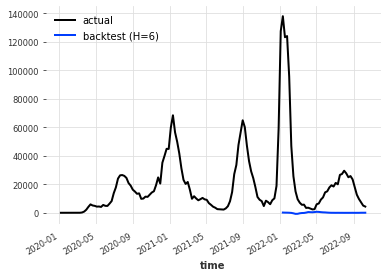

In [ ]:
import plotly.express as px
from darts.utils.utils import TimeSeries
from darts.dataprocessing.transformers import Scaler as sc
from darts.models import NBEATSModel, TCNModel
from darts.utils.timeseries_generation import datetime_attribute_timeseries
import matplotlib.pyplot as plt
from darts.metrics import mse

for clean_region in clean_regions_final:
  region_symptom_data = us_covid_symptom_data[us_covid_symptom_data.sub_region_1 == clean_region]
  region_symptom_data['date'] = pd.to_datetime(region_symptom_data.date)
  region_code = region_symptom_data.sub_region_1_code.unique()[0].split('US-')[1]
  region_symptom_data = region_symptom_data.drop(['country_region', 'country_region_code', 'sub_region_1', 'sub_region_1_code', 'sub_region_2', 'sub_region_2_code', 'place_id'], axis = 1)
  merged_region_cdc_symptoms = region_symptom_data.merge(cdc_states[region_code], on='date', how='outer')
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['conf_cases', 'prob_cases', 'pnew_case', 'tot_death', 'conf_death', 'prob_death', 'new_death', 'pnew_death', 'state'], axis = 1)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['tot_cases'], axis = 1)
  merged_region_cdc_symptoms['new_case'] = merged_region_cdc_symptoms['new_case'].fillna(0)
  fig = px.line(merged_region_cdc_symptoms, x='date', y="new_case")
  fig.show()
  merged_region_cdc_symptoms.index = pd.to_datetime(merged_region_cdc_symptoms.date)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['date'], axis = 1)
  symptoms_considered = df[df.state == region_code]
  symptoms_considered.reset_index()
  symptoms_considered = symptoms_considered['grangersymptoms']
  symptoms_considered = symptoms_considered.values
  symptoms_considered = symptoms_considered[0]
  time_series_merged_region_cdc = TimeSeries.from_dataframe(symptoms_considered_cdc)
  new_cases = time_series_merged_region_cdc['new_case']
  new_cases_train, new_cases_val = new_cases.split_before(0.6)
  past_covariates = scaled_time_series_region_cdc.drop_columns('new_case')
  past_covariates_train , past_covariates_val = past_covariates.split_before(0.6)
  input_c_length_tcn = input_chunk_length_good_regions_tcn[clean_region]


  model_prediction = model_air = TCNModel(
    input_chunk_length=input_c_length_tcn,
    output_chunk_length=5,
    n_epochs=500,
    dropout=0.1,
    dilation_base=2,
    weight_norm=True,
    kernel_size=5,
    num_filters=3,
    random_state=0,
  )
  model_prediction.fit(
    series=new_cases_train,
    past_covariates=past_covariates_train,
    val_series=new_cases_val,
    val_past_covariates=past_covariates_val,
    verbose=True,
  )
  pred_new_case = model_prediction.predict(n = 5)
  print("RMSE scaled data:", np.sqrt(mse(new_cases_val['new_case'][:5] , pred_new_case['new_case'])))
  pred_new_case = symptom_scaler.inverse_transform(pred_new_case)
  val_descaled = symptom_scaler.inverse_transform(new_cases_val)
  print("RMSE :", np.sqrt(mse(val_descaled['new_case'][:5] , pred_new_case['new_case'])))
  time_series_merged_region_cdc['new_case'].plot(label = "actual")
  pred_new_case['new_case'].plot(label = 'forecasted')
  plt.show()



PREDICTION FOR BAD REGIONS

In [ ]:
input_chunk_length_bad_regions_nbeats = {"Alabama" : 25,"South Carolina":15, "Mississippi":20, "Arkansas":25, "Kentucky":15, "Nevada":20, "Oregon":20, "Utah":20, "Idaho":15, "New Mexico":15 }

input_chunk_length_bad_regions_tcn = {"Alabama":25,"South Carolina":15, "Mississippi":20, "Arkansas":20, "Kentucky":20, "Nevada":20, "Oregon":20, "Utah":20, "Idaho":15, "New Mexico":15 }

In [ ]:
region_codes = {"Alabama":"AL","South Carolina":"SC", "Mississippi":"MS", "Arkansas":"AR", "Kentucky":"KY", "Nevada":"NV", "Oregon":"OR", "Utah":"UT", "Idaho":"ID", "New Mexico":"NM" }

In [ ]:
import plotly.express as px
from darts.utils.utils import TimeSeries
from darts.dataprocessing.transformers import Scaler as sc
from darts.models import NBEATSModel, TCNModel
import matplotlib.pyplot as plt
from darts.metrics import mse

for bad_region in bad_regions_final:
  region_symptom_data = pd.read_csv("drive/MyDrive/COVID - Trends Data/Imputed bad region data/" + str(bad_region) + "_imputed_data.csv")
  region_symptom_data['date'] = pd.to_datetime(region_symptom_data.date)
  region_code = region_codes[bad_region]
  merged_region_cdc_symptoms = region_symptom_data.merge(cdc_states[region_code], on='date', how='outer')
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['conf_cases', 'prob_cases', 'pnew_case', 'tot_death', 'conf_death', 'prob_death', 'new_death', 'pnew_death', 'state'], axis = 1)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['tot_cases'], axis = 1)
  merged_region_cdc_symptoms['new_case'] = merged_region_cdc_symptoms['new_case'].fillna(0)
  fig = px.line(merged_region_cdc_symptoms, x='date', y="new_case")
  fig.show()
  merged_region_cdc_symptoms.index = pd.to_datetime(merged_region_cdc_symptoms.date)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['date'], axis = 1)
  symptoms_considered = df[df.state == region_code]
  symptoms_considered.reset_index()
  symptoms_considered = symptoms_considered['grangersymptoms']
  symptoms_considered = symptoms_considered.values
  symptoms_considered = symptoms_considered[0]
  cols_to_keep = np.append(symptoms_considered, np.array(['new_case']))
  symptoms_considered_cdc = merged_region_cdc_symptoms[cols_to_keep]
  time_series_merged_region_cdc = TimeSeries.from_dataframe(symptoms_considered_cdc)
  symptom_scaler = sc()
  scaled_time_series_region_cdc = symptom_scaler.fit_transform(time_series_merged_region_cdc)
  new_cases = time_series_merged_region_cdc['new_case']
  new_cases_train, new_cases_val = new_cases.split_before(0.6)
  past_covariates = scaled_time_series_region_cdc.drop_columns('new_case')
  past_covariates_train , past_covariates_val = past_covariates.split_before(0.6)
  input_c_length_nbeats = input_chunk_length_bad_regions_nbeats[bad_region]
  model_prediction = NBEATSModel (input_chunk_length=input_c_length_nbeats, output_chunk_length=5, n_epochs = 200)
  model_prediction.fit(new_cases_train, past_covariates=past_covariates_train, verbose = True)
  pred_new_case = model_prediction.predict(n = 5)
  print("RMSE scaled data:", np.sqrt(mse(new_cases_val['new_case'][:5] , pred_new_case['new_case'])))
  pred_new_case = symptom_scaler.inverse_transform(pred_new_case)
  val_descaled = symptom_scaler.inverse_transform(new_cases_val)
  print("RMSE :", np.sqrt(mse(val_descaled['new_case'][:5] , pred_new_case['new_case'])))
  time_series_merged_region_cdc['new_case'].plot(label = "actual")
  pred_new_case['new_case'].plot(label = 'forecasted')
  plt.show()
  



In [ ]:
import plotly.express as px
from darts.utils.utils import TimeSeries
from darts.dataprocessing.transformers import Scaler as sc
from darts.models import NBEATSModel, TCNModel
from darts.utils.timeseries_generation import datetime_attribute_timeseries
import matplotlib.pyplot as plt
from darts.metrics import mse

for bad_region in bad_regions_final:
  region_symptom_data = pd.read_csv("drive/MyDrive/COVID - Trends Data/Imputed bad region data/" + str(bad_region) + "_imputed_data.csv")
  region_symptom_data['date'] = pd.to_datetime(region_symptom_data.date)
  region_code = region_codes[bad_region]
  merged_region_cdc_symptoms = region_symptom_data.merge(cdc_states[region_code], on='date', how='outer')
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['conf_cases', 'prob_cases', 'pnew_case', 'tot_death', 'conf_death', 'prob_death', 'new_death', 'pnew_death', 'state'], axis = 1)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['tot_cases'], axis = 1)
  merged_region_cdc_symptoms['new_case'] = merged_region_cdc_symptoms['new_case'].fillna(0)
  fig = px.line(merged_region_cdc_symptoms, x='date', y="new_case")
  fig.show()
  merged_region_cdc_symptoms.index = pd.to_datetime(merged_region_cdc_symptoms.date)
  merged_region_cdc_symptoms = merged_region_cdc_symptoms.drop(['date'], axis = 1)
  symptoms_considered = df[df.state == region_code]
  symptoms_considered.reset_index()
  symptoms_considered = symptoms_considered['grangersymptoms']
  symptoms_considered = symptoms_considered.values
  symptoms_considered = symptoms_considered[0]
  time_series_merged_region_cdc = TimeSeries.from_dataframe(symptoms_considered_cdc)
  new_cases = time_series_merged_region_cdc['new_case']
  new_cases_train, new_cases_val = new_cases.split_before(0.6)
  past_covariates = scaled_time_series_region_cdc.drop_columns('new_case')
  past_covariates_train , past_covariates_val = past_covariates.split_before(0.6)
  input_c_length_tcn = input_chunk_length_bad_regions_tcn[bad_region]


  model_prediction = model_air = TCNModel(
    input_chunk_length=input_c_length_tcn,
    output_chunk_length=5,
    n_epochs=500,
    dropout=0.1,
    dilation_base=2,
    weight_norm=True,
    kernel_size=5,
    num_filters=3,
    random_state=0,
  )
  model_prediction.fit(
    series=new_cases_train,
    past_covariates=past_covariates_train,
    val_series=new_cases_val,
    val_past_covariates=past_covariates_val,
    verbose=True,
  )
  pred_new_case = model_prediction.predict(n = 5)
  print("RMSE scaled data:", np.sqrt(mse(new_cases_val['new_case'][:5] , pred_new_case['new_case'])))
  pred_new_case = symptom_scaler.inverse_transform(pred_new_case)
  val_descaled = symptom_scaler.inverse_transform(new_cases_val)
  print("RMSE :", np.sqrt(mse(val_descaled['new_case'][:5] , pred_new_case['new_case'])))
  time_series_merged_region_cdc['new_case'].plot(label = "actual")
  pred_new_case['new_case'].plot(label = 'forecasted')
  plt.show()



PREDICTION FOR BAD REGIONS  